###Automatic Image Clustering

In [ ]:
! pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 32.1 MB/s 


In [ ]:
! pip install face_recognition Scikit-learn dlib docopt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 100.1 MB 27 kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566186 sha256=f4b8e34b982ada8fae841147c036377627abb7958380bebb671305e72fdf6a18
  Stored in directory: /root/.cache/pip/wheels/d6/81/3c/884bcd5e1c120ff548d57c2ecc9ebf3281c9a6f7c0e7e7947a
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13723 sha256=36f46b6983f0e40e3602f73fa8b5765a9050d9eeacc715d1a4a4c5082998c11e
  Stored in directory: /root/.cache/pip/wheels/72/b0/3f/1d95f96ff986c7dfffe46ce2be4062f38ebd04b506c77c81b9
Successfully built face-recognition-models docopt


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
import face_recognition
import docopt

In [ ]:
from scipy import spatial

In [ ]:
import pandas as pd

In [ ]:
import dlib

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import matplotlib.image as mping
%matplotlib inline

In [ ]:
! pip install sklearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1310 sha256=bd6ba5d89dba73a25973b21a74ba5840725204b06f4c034357e47cb2faed59f9
  Stored in directory: /root/.cache/pip/wheels/46/ef/c3/157e41f5ee1372d1be90b09f74f82b10e391eaacca8f22d33e
Successfully built sklearn


In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np
import cv2
import pickle
import os
from PIL import Image, ImageOps

In [ ]:
import mtcnn

In [ ]:
import numpy.matlib

In [ ]:
import zipfile
def unzip_data(filename):
  zip_ref = zipfile.ZipFile(filename, "r")
  zip_ref.extractall()
  zip_ref.close()

In [ ]:
unzip_data('/content/IIT-Bhilai-Day 2.zip')

###Face Detection

2/2 [==============================] - 0s 53ms/step


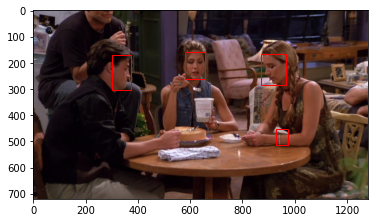

In [ ]:
# face detection with mtcnn on a photograph
from matplotlib import pyplot
from matplotlib.patches import Rectangle
from mtcnn.mtcnn import MTCNN

# draw an image with detected objects
def draw_image_with_boxes(filename, result_list):
	# load the image
	data = pyplot.imread(filename)
	# plot the image
	pyplot.imshow(data)
	# get the context for drawing boxes
	ax = pyplot.gca()
	# plot each box
	for result in result_list:
		# get coordinates
		x, y, width, height = result['box']
		# create the shape
		rect = Rectangle((x, y), width, height, fill=False, color='red')
		# draw the box
		ax.add_patch(rect)
	# show the plot
	pyplot.show()

filename = '/content/IIT-Bhilai-Day 2/Training_Friends_Dataset_100_imgs/01973cc2-75d5-4844-9d36-675b91c402e9.JPG'
# load image from file
pixels = pyplot.imread(filename)
# create the detector, using default weights
detector = MTCNN()

# detect faces in the image
faces = detector.detect_faces(pixels)
# display faces on the original image
draw_image_with_boxes(filename, faces)

###PATH

In [ ]:
PATH = "/content/IIT-Bhilai-Day 2/Training_Friends_Dataset_100_imgs/"

###Retrieving faces

In [ ]:
names = []
for file in os.listdir(PATH):
  names.append(file)
names.sort()

In [ ]:
names

['013e51cf-1999-44ac-8004-542a0de4026f.JPG',
 '01973cc2-75d5-4844-9d36-675b91c402e9.JPG',
 '03d24609-64ca-4f43-9b80-f073e6433c49.JPG',
 '04f16b2a-e54d-4e5e-bba6-75365d8efc3e.JPG',
 '04f48620-de82-4f55-a787-ac234cd861d2.JPG',
 '0689d579-3389-4c45-b898-97e33631998f.JPG',
 '06fa507f-cee0-4dca-b46a-ce1309cf21ed.JPG',
 '084a3d15-1560-4044-a8ac-3fdb121cf596.JPG',
 '0a7d65f1-e731-40ea-b6b1-7b98e30d1b47.JPG',
 '0b4b8e34-6f1b-49bf-a188-a16e497a3fce.JPG',
 '0bdbbfcc-41b7-4b6e-8089-3c982a594739.JPG',
 '0c70033f-0028-4b71-8045-9d716e3725d4.JPG',
 '0ce7ff02-e285-434f-a439-622057d76e4d.JPG',
 '0d339138-c7b9-4aee-8c12-6353718238ca.JPG',
 '0d95708f-c5cd-4f37-9fae-b09bac0fe12e.JPG',
 '0e30379a-a854-4f58-b767-721a57802e67.JPG',
 '0e969de7-b17e-4735-b84d-4c9a3dbbac21.JPG',
 '1218bed0-9a54-4d98-b77d-f17ed1e9770b.JPG',
 '1443d452-4793-490e-a26c-ce7f8521c599.JPG',
 '14c9d245-ef9b-4c3d-a186-5dd90e43f9ff.JPG',
 '14ce5a5c-5bce-441a-b024-fb620ef1f881.JPG',
 '16bad20c-51c2-4d08-bec1-25db95d7d231.JPG',
 '16cdf3c8

In [ ]:
# extract and plot each detected face in a photograph
import os
from matplotlib import pyplot
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
from mtcnn.mtcnn import MTCNN

PATH = "/content/IIT-Bhilai-Day 2/Training_Friends_Dataset_100_imgs/"
images = []
image_labels = []
for m in range(len(names)):
  # load image from file
  pixels = pyplot.imread(PATH+names[m])
  # create the detector, using default weights
  detector = MTCNN()
  # detect faces in the image
  print(names[m])
  if(PATH+names[m] == "/content/IIT-Bhilai-Day 2/Training_Friends_Dataset_100_imgs/4c94a77a-ccde-44fc-a6fa-ad9130743036.JPG"):
    print("image skipped number:",m)
    continue
  faces = detector.detect_faces(pixels)
  print(m)
  for i in range(len(faces)):
    data = cv2.imread(PATH+names[m])
    x1, y1, width, height = faces[i]['box']
    x2, y2 = x1 + width, y1 + height
    image = data[y1:y2, x1:x2]
    images.append(image)
    image_labels.append(str(i)+'_'+str(m))
    #cv2.imwrite('/content/gdrive/MyDrive/images/'+str(i)+'_'+str(k)+'.jpg', image)


013e51cf-1999-44ac-8004-542a0de4026f.JPG
1/1 [==============================] - 0s 109ms/step
0
01973cc2-75d5-4844-9d36-675b91c402e9.JPG
2/2 [==============================] - 0s 8ms/step
1
03d24609-64ca-4f43-9b80-f073e6433c49.JPG
1/1 [==============================] - 0s 116ms/step
2
04f16b2a-e54d-4e5e-bba6-75365d8efc3e.JPG
1/1 [==============================] - 0s 112ms/step
3
04f48620-de82-4f55-a787-ac234cd861d2.JPG
1/1 [==============================] - 0s 115ms/step
4
0689d579-3389-4c45-b898-97e33631998f.JPG
1/1 [==============================] - 0s 118ms/step
5
06fa507f-cee0-4dca-b46a-ce1309cf21ed.JPG
1/1 [==============================] - 0s 118ms/step
6
084a3d15-1560-4044-a8ac-3fdb121cf596.JPG
2/2 [==============================] - 0s 9ms/step
7
0a7d65f1-e731-40ea-b6b1-7b98e30d1b47.JPG
1/1 [==============================] - 0s 114ms/step
8
0b4b8e34-6f1b-49bf-a188-a16e497a3fce.JPG
1/1 [==============================] - 0s 113ms/step
9
0bdbbfcc-41b7-4b6e-8089-3c982a594739.JPG
1/1

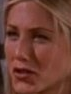

0_39


In [ ]:
data = cv2_imshow(images[62])
print(image_labels[62])
data

0


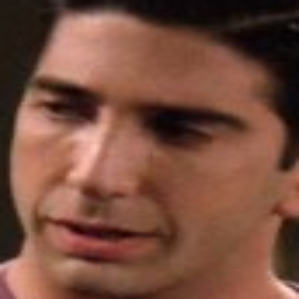

1


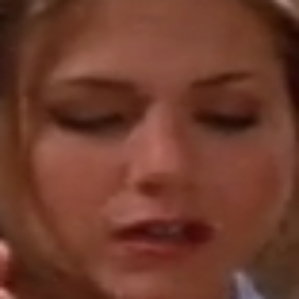

2


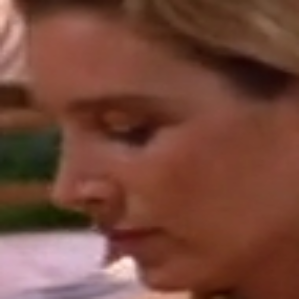

3


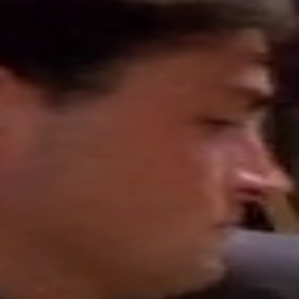

4


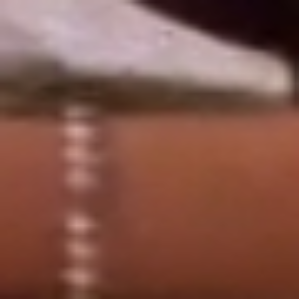

5


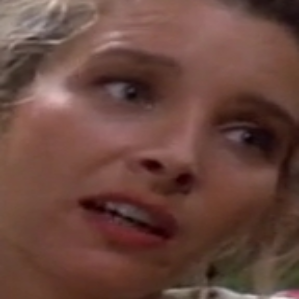

6


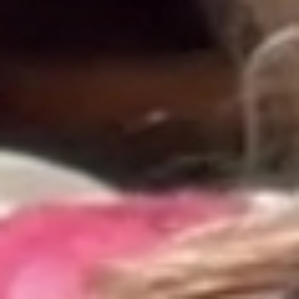

7


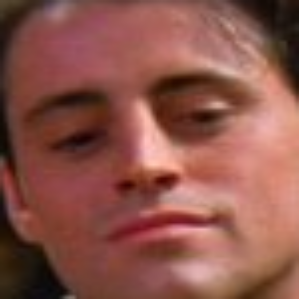

8


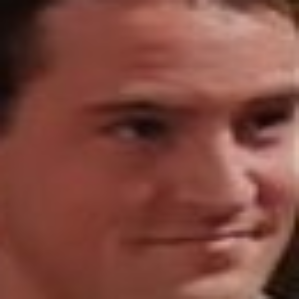

9


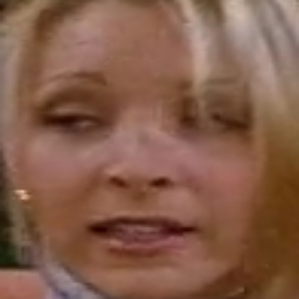

10


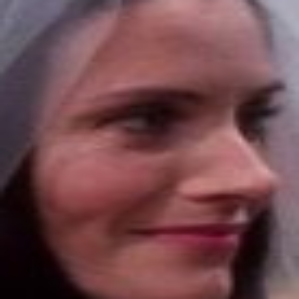

11


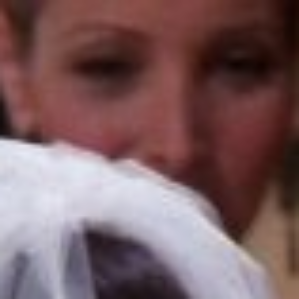

12


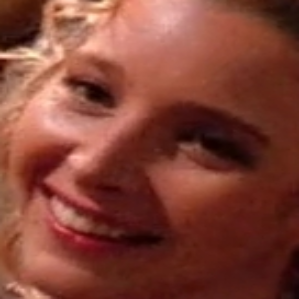

13


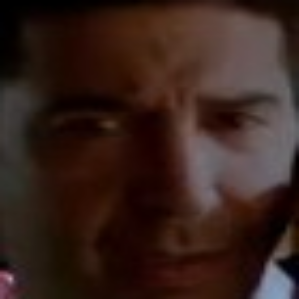

14


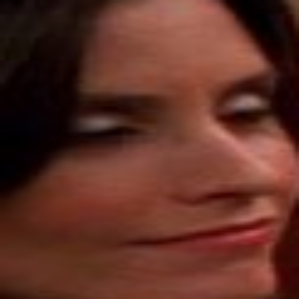

15


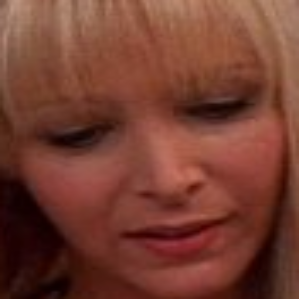

16


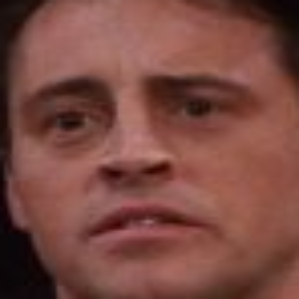

17


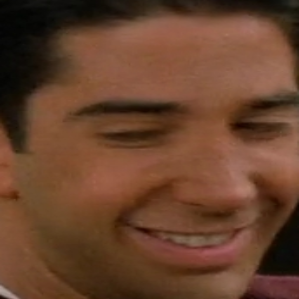

18


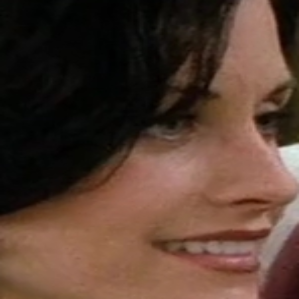

19


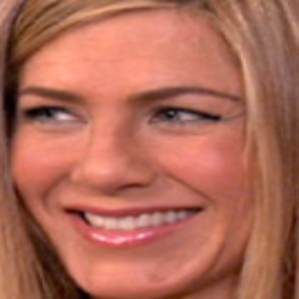

20


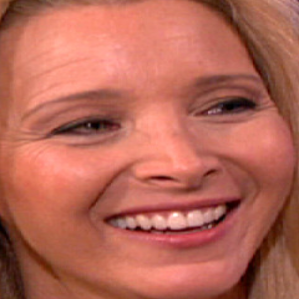

21


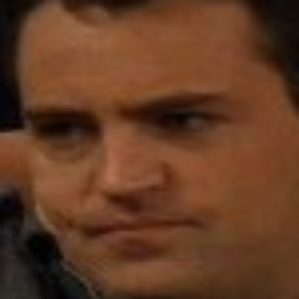

22


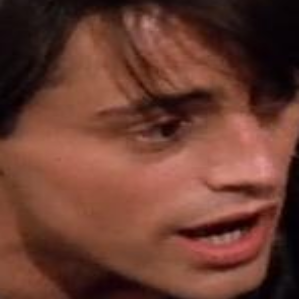

23


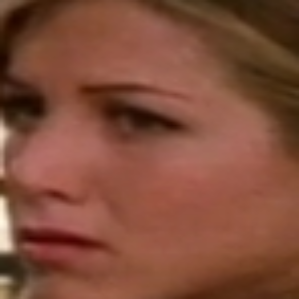

24


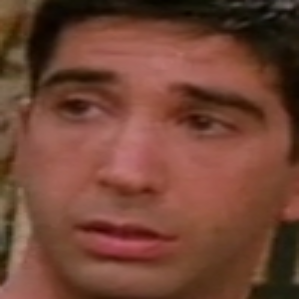

25


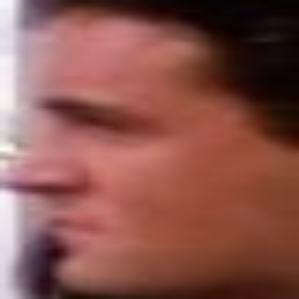

26


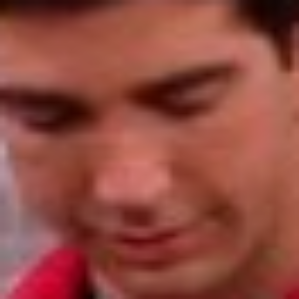

27


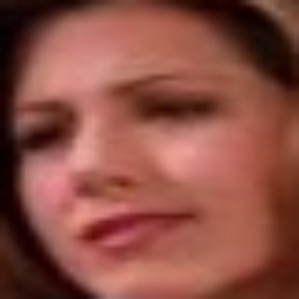

28


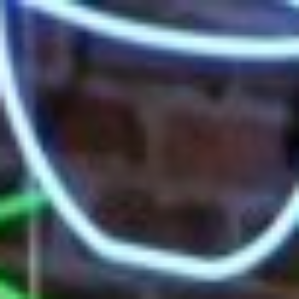

29


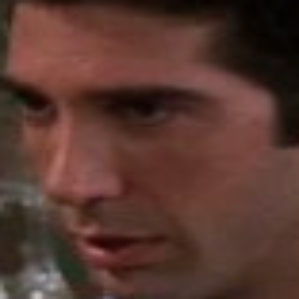

30


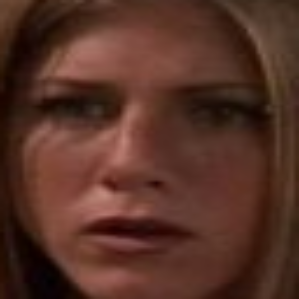

31


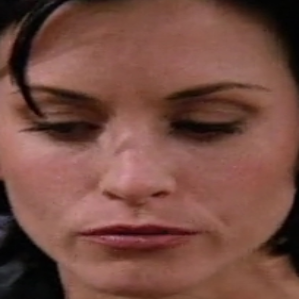

32


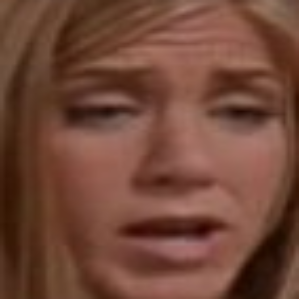

33


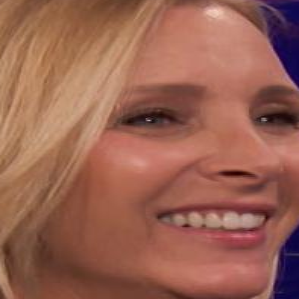

34


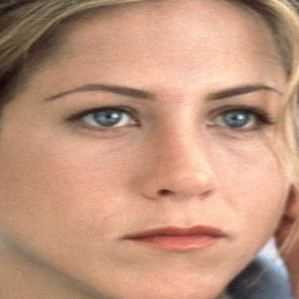

35


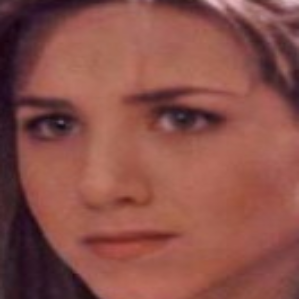

36


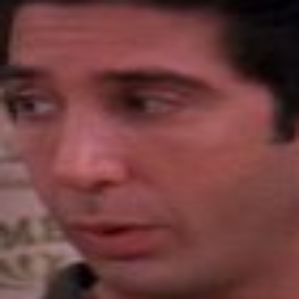

37


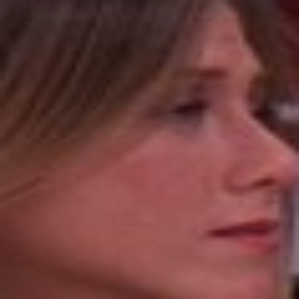

38


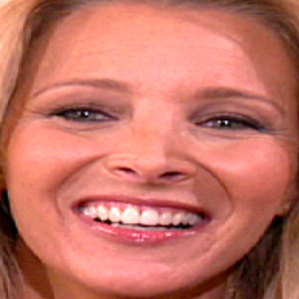

39


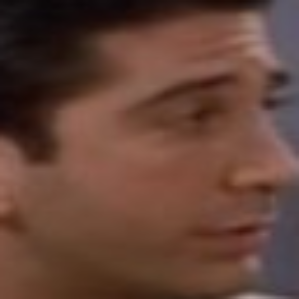

40


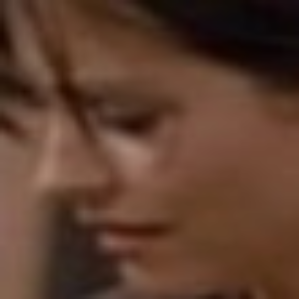

41


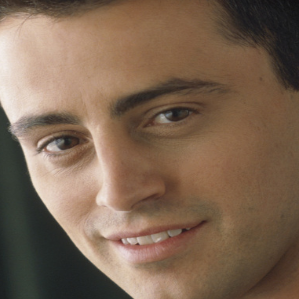

42


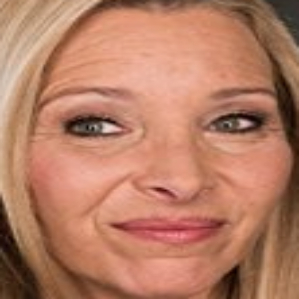

43


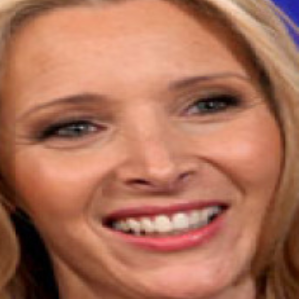

44


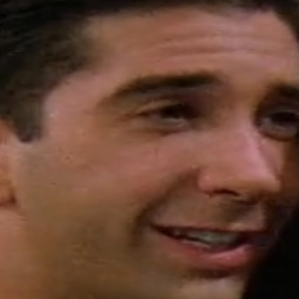

45


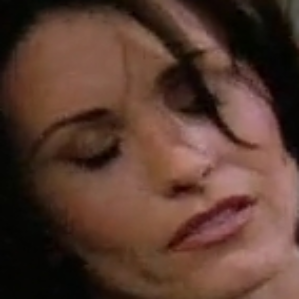

46


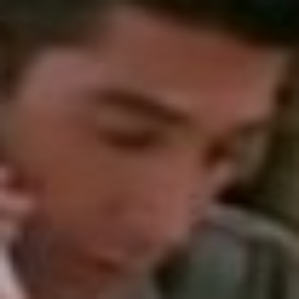

47


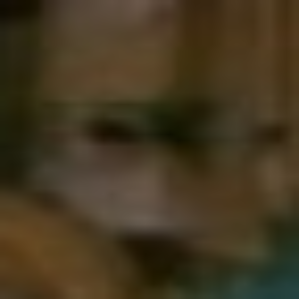

48


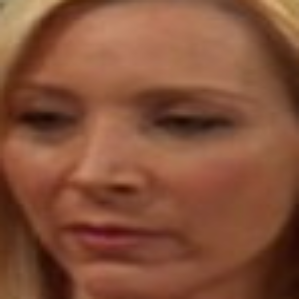

49


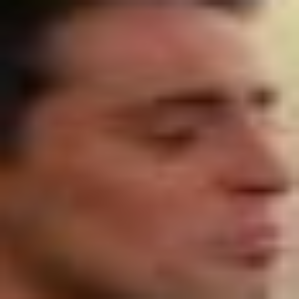

50


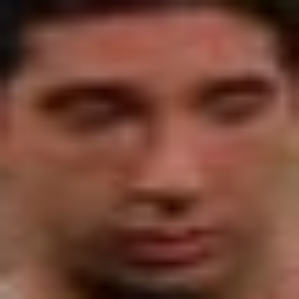

51


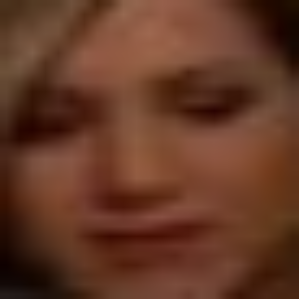

52


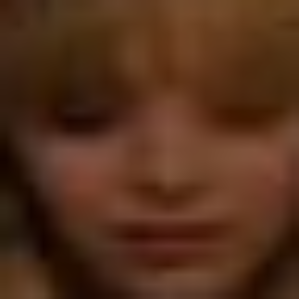

53


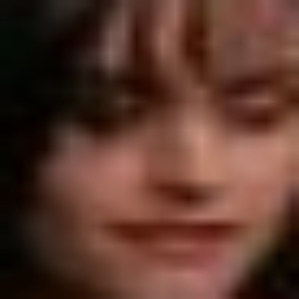

54


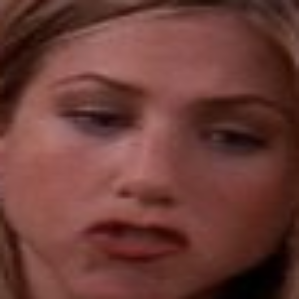

55


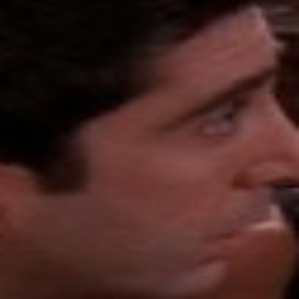

56


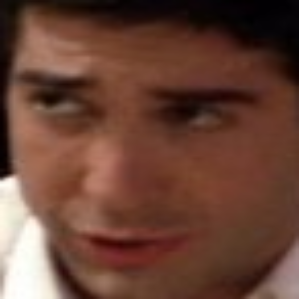

57


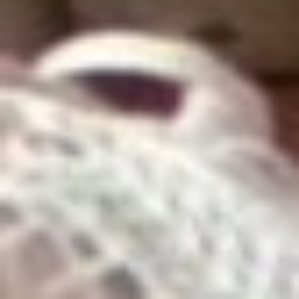

58


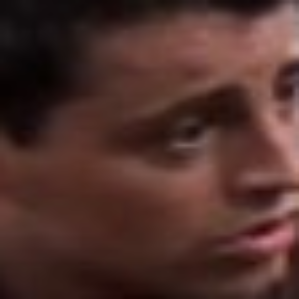

59


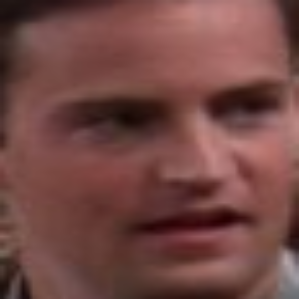

60


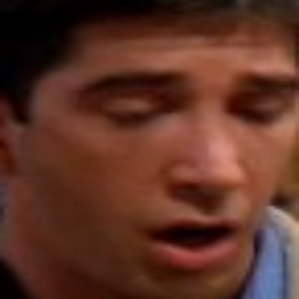

61


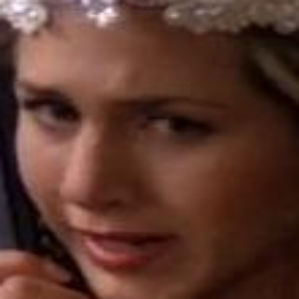

62


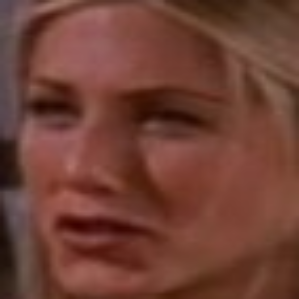

63


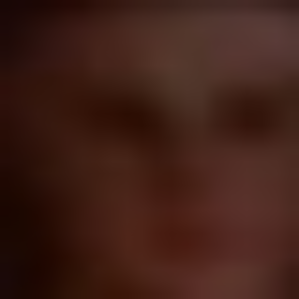

64


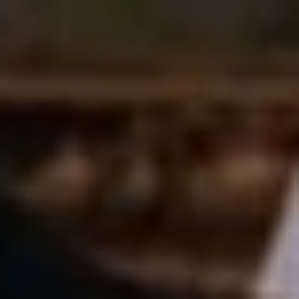

65


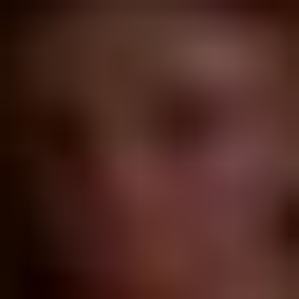

66


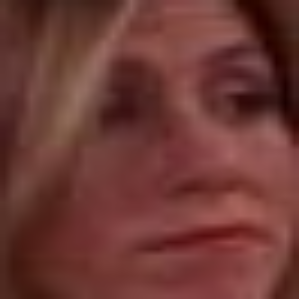

67


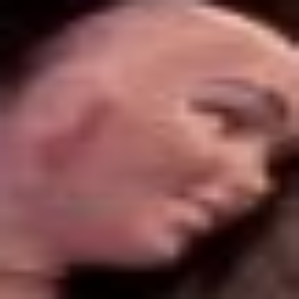

68


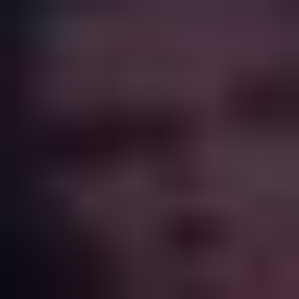

69


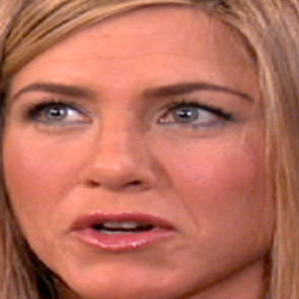

70


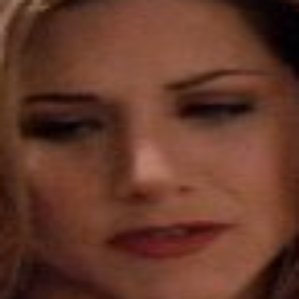

71


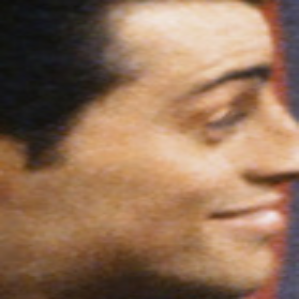

72


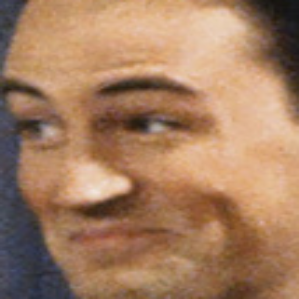

73


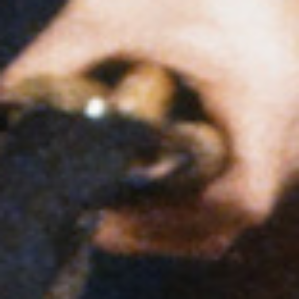

74


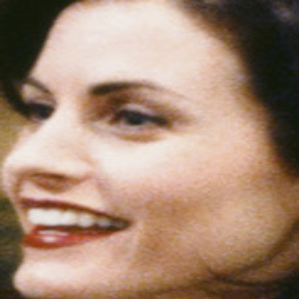

75


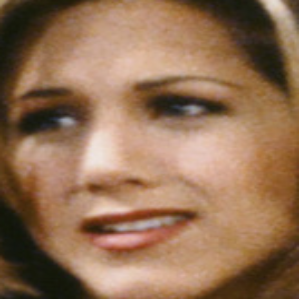

76


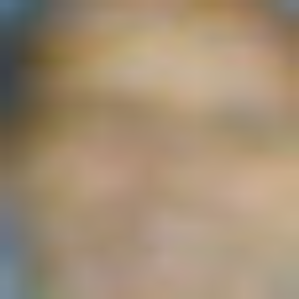

77


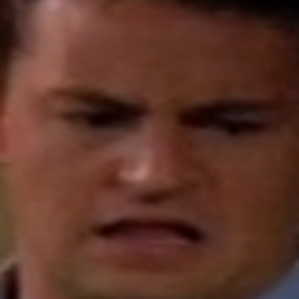

78


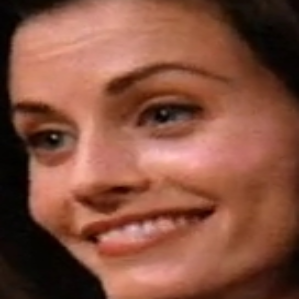

79


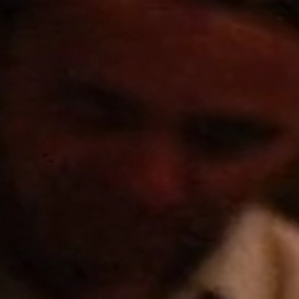

80


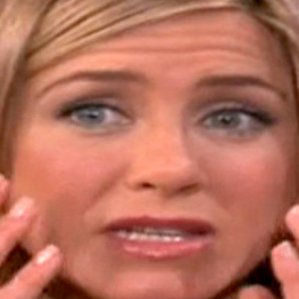

81


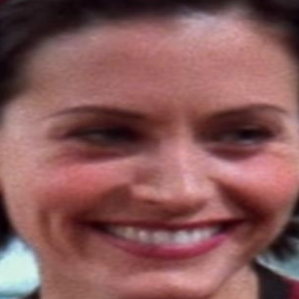

82


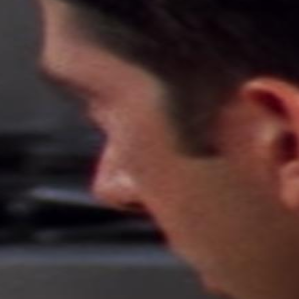

83


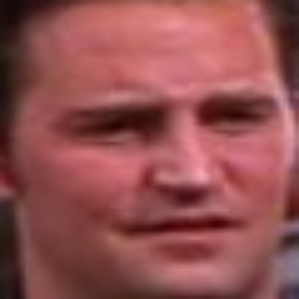

84


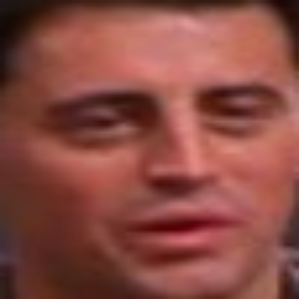

85


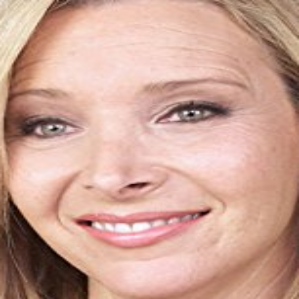

86


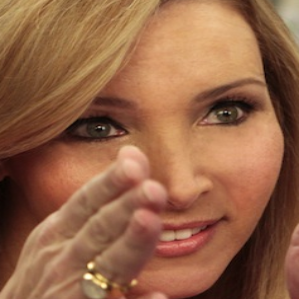

87


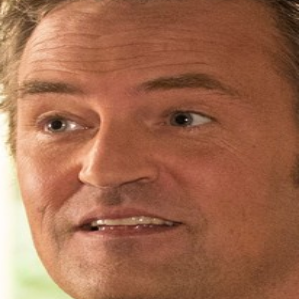

88


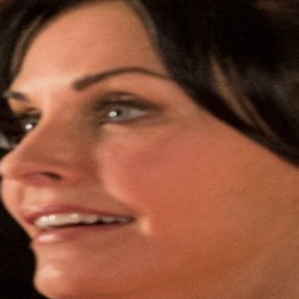

89


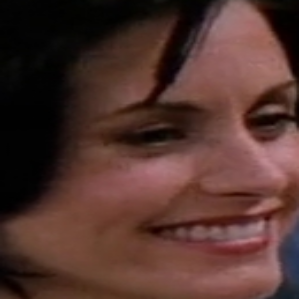

90


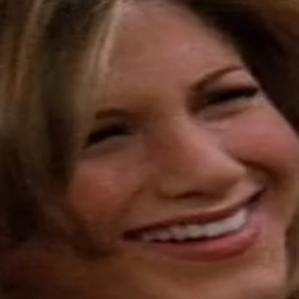

91


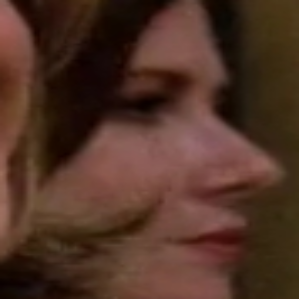

92


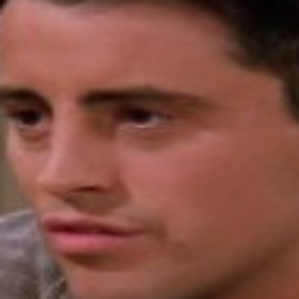

93


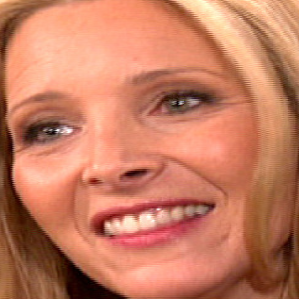

94


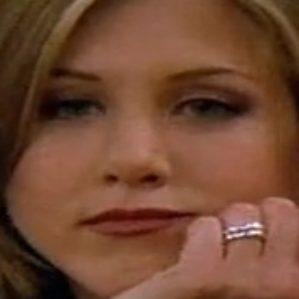

95


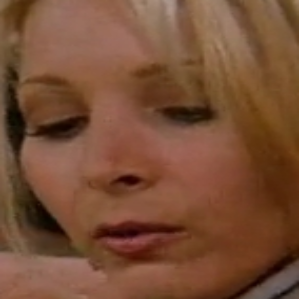

96


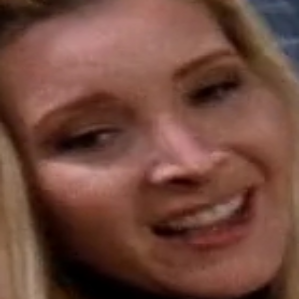

97


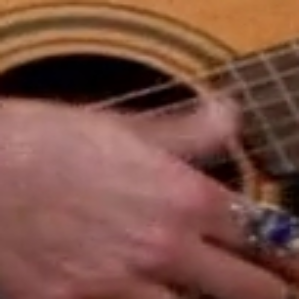

98


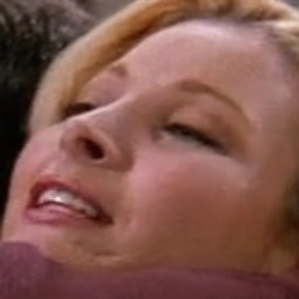

99


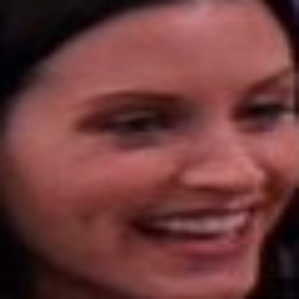

100


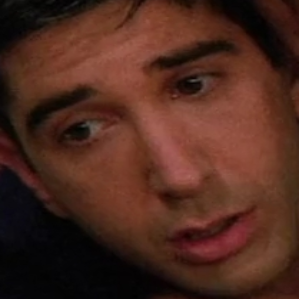

101


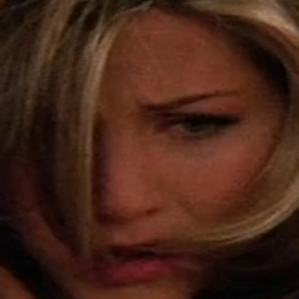

102


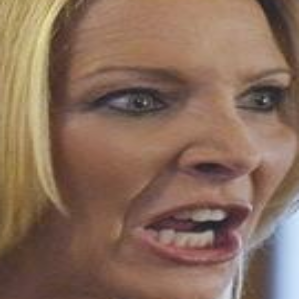

103


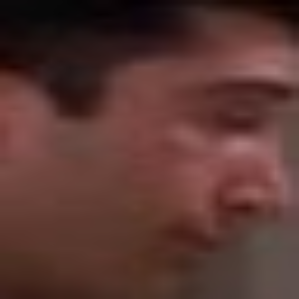

104


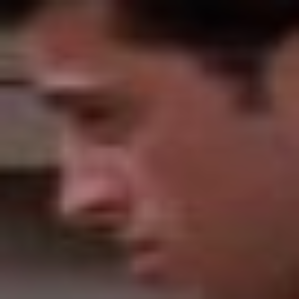

105


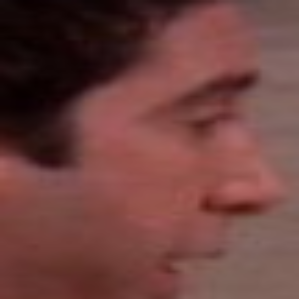

106


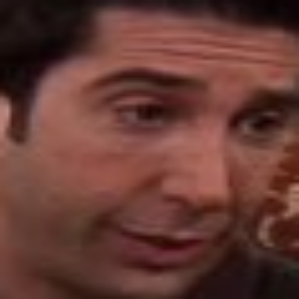

107


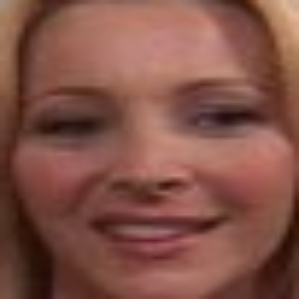

108


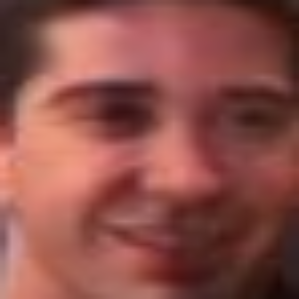

109


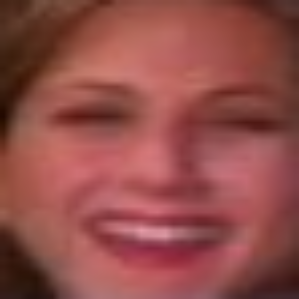

110


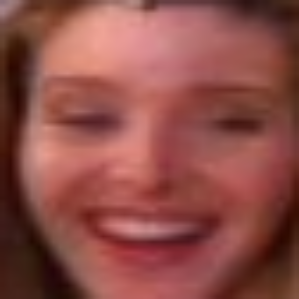

111


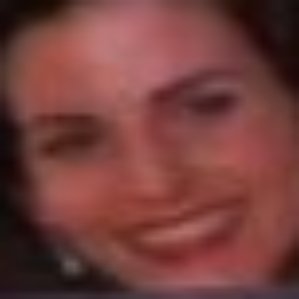

112


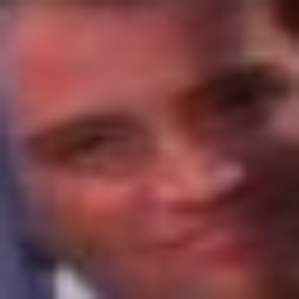

113


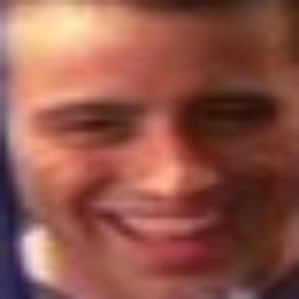

114


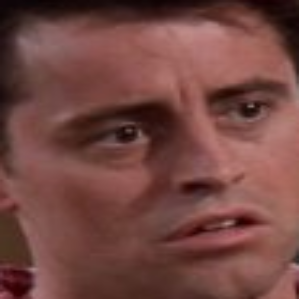

115


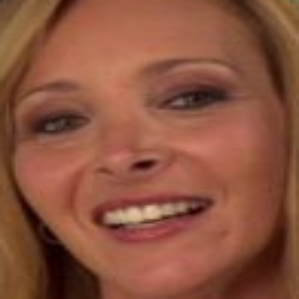

116


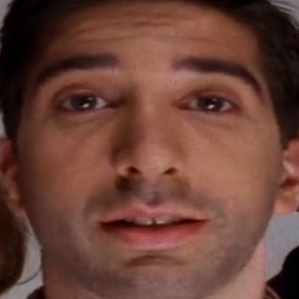

117


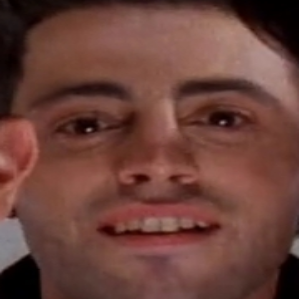

118


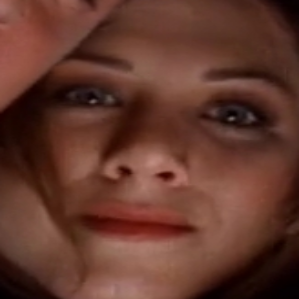

119


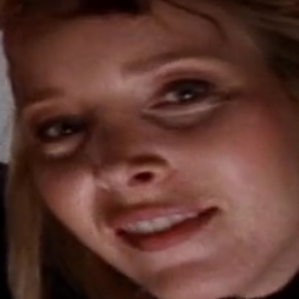

120


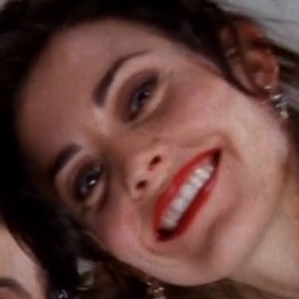

121


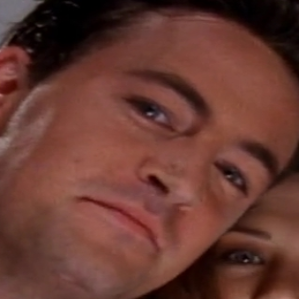

122


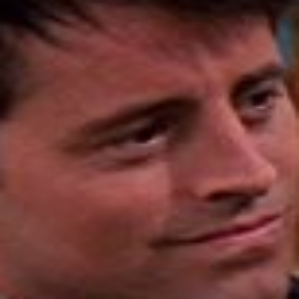

123


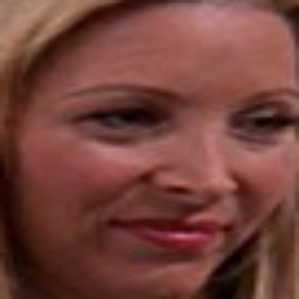

124


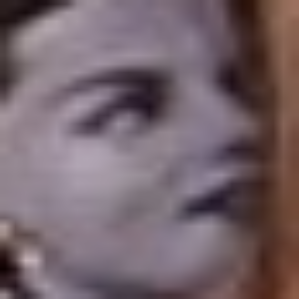

125


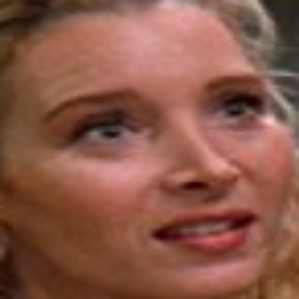

126


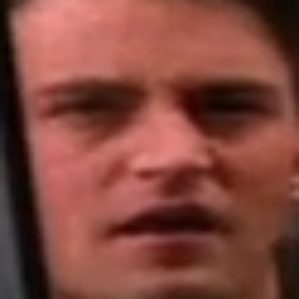

127


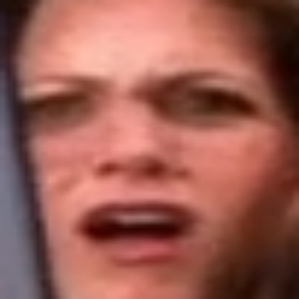

128


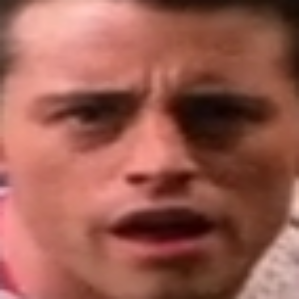

129


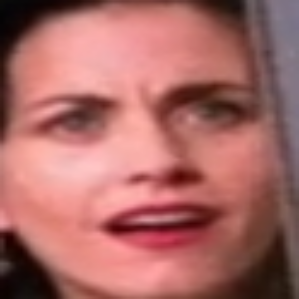

130


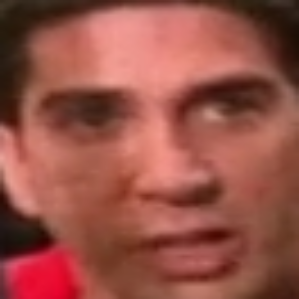

131


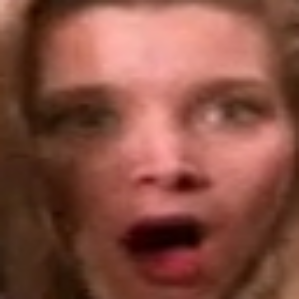

132


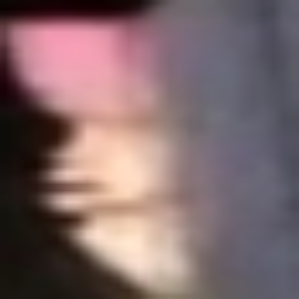

133


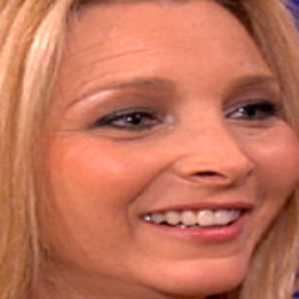

134


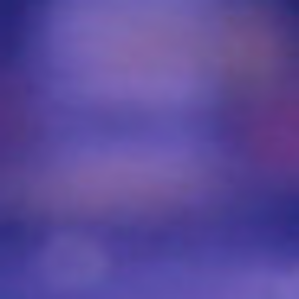

135


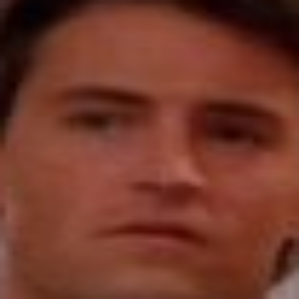

136


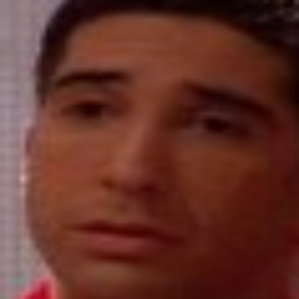

137


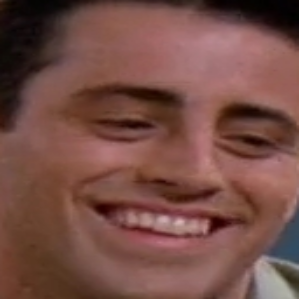

138


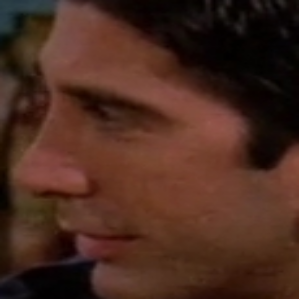

139


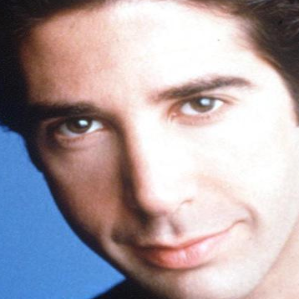

140


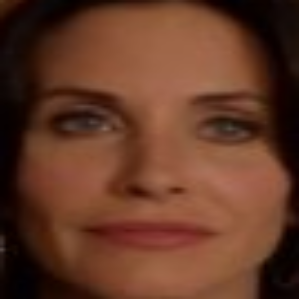

141


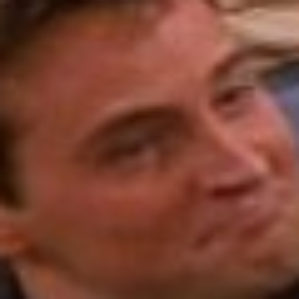

142


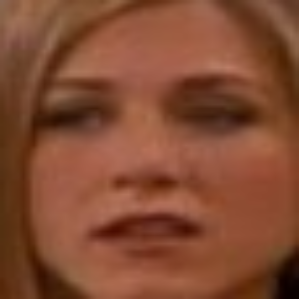

143


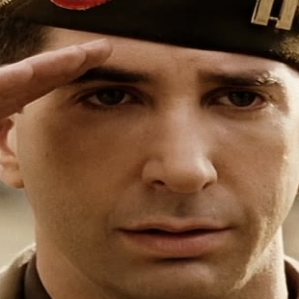

144


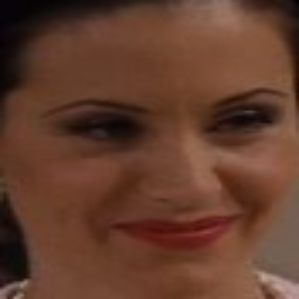

145


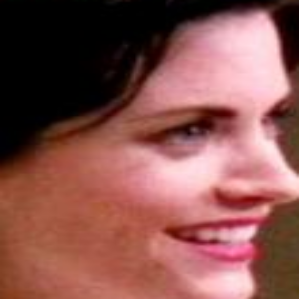

146


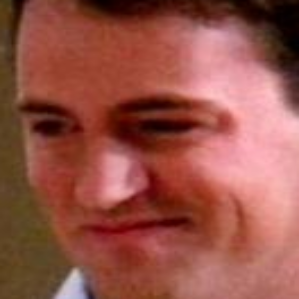

147


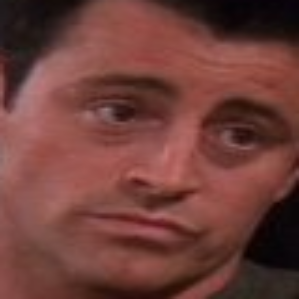

148


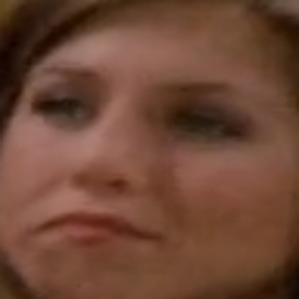

149


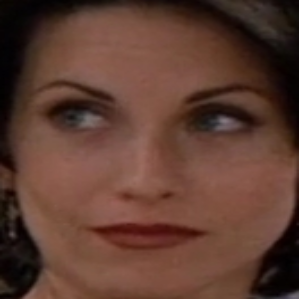

150


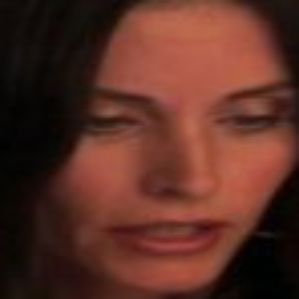

151


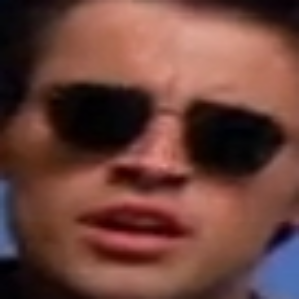

152


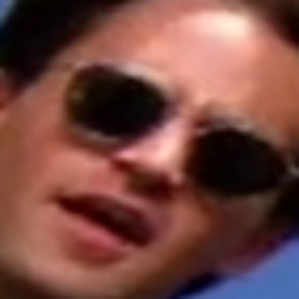

153


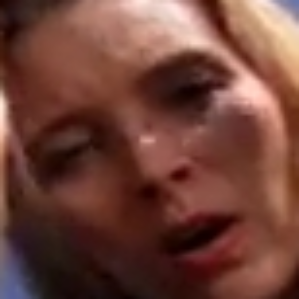

154


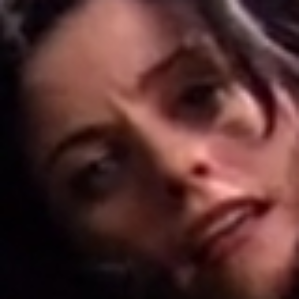

155


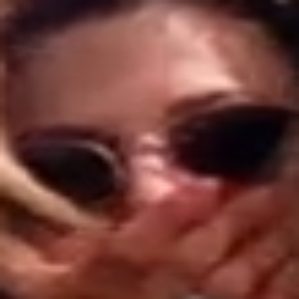

156


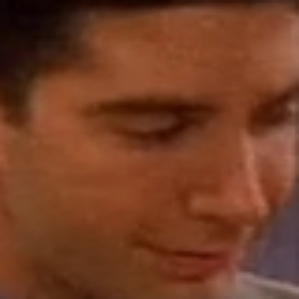

157


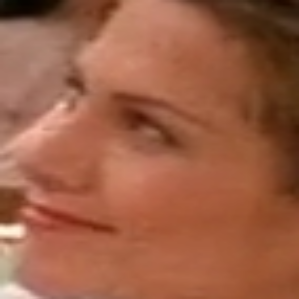

158


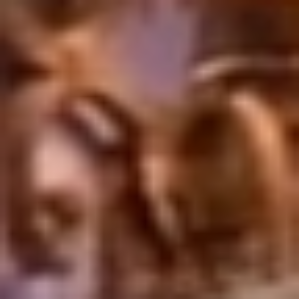

159


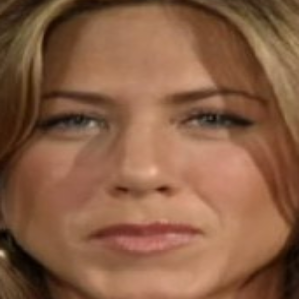

160


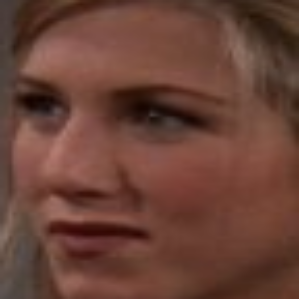

161


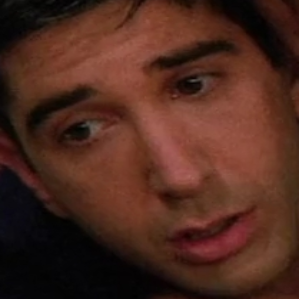

162


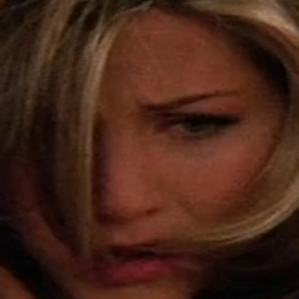

163


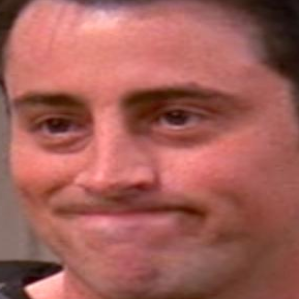

164


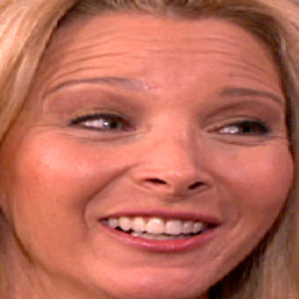

165


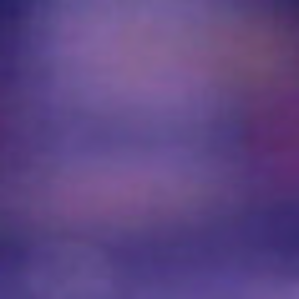

166


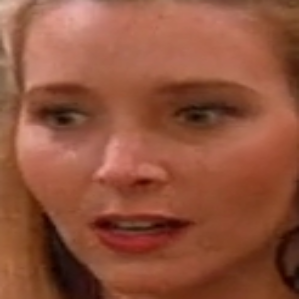

167


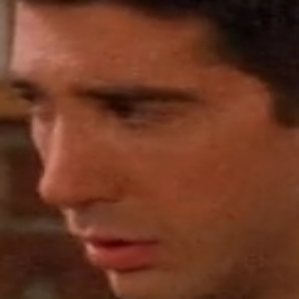

168


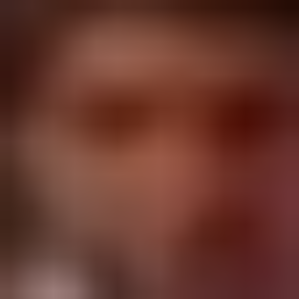

169


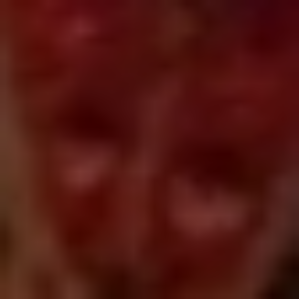

170


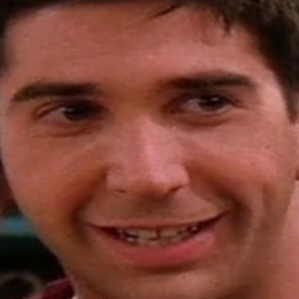

171


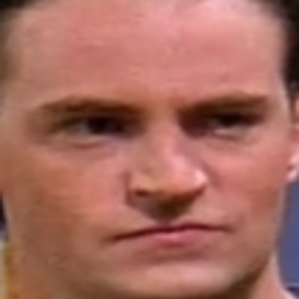

172


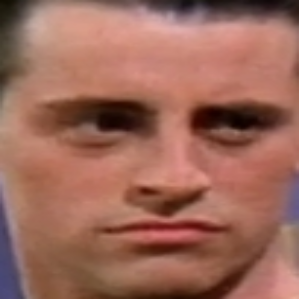

173


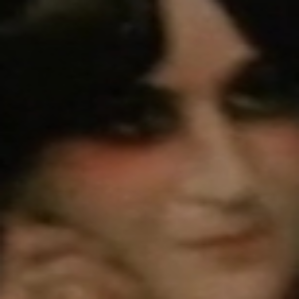

174


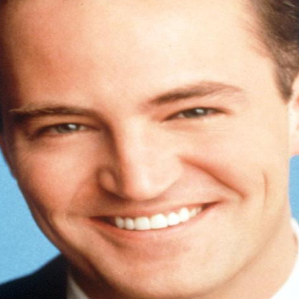

175


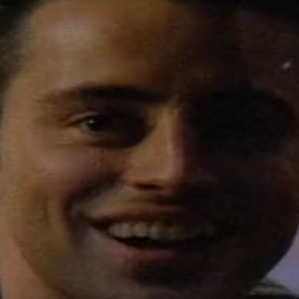

176


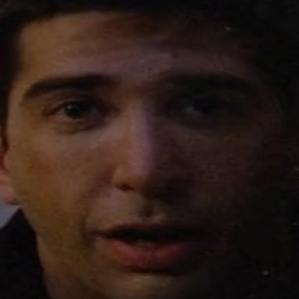

177


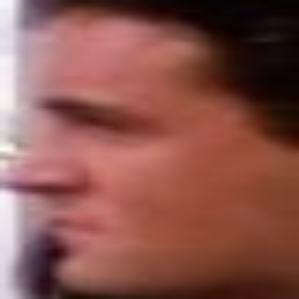

178


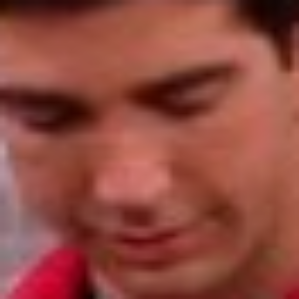

179


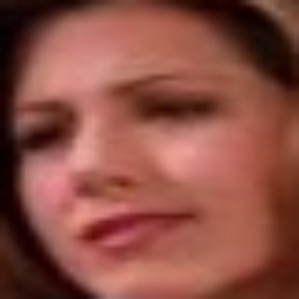

180


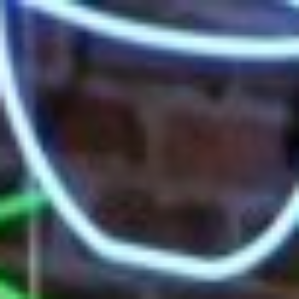

181


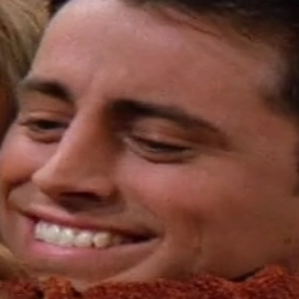

182


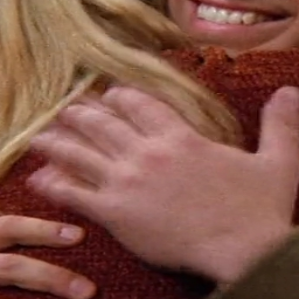

In [ ]:
k = 0
for i in training:
  print(k)
  cv2_imshow(i)
  k = k+1

In [ ]:
image_labels

['0_0',
 '0_1',
 '1_1',
 '2_1',
 '3_1',
 '0_2',
 '1_2',
 '0_3',
 '0_4',
 '0_5',
 '0_6',
 '1_6',
 '0_7',
 '0_8',
 '0_9',
 '1_9',
 '0_10',
 '0_11',
 '1_11',
 '0_12',
 '0_13',
 '0_14',
 '0_15',
 '0_16',
 '1_16',
 '0_17',
 '1_17',
 '2_17',
 '3_17',
 '0_18',
 '1_18',
 '0_19',
 '0_20',
 '0_21',
 '0_22',
 '0_23',
 '0_24',
 '1_24',
 '0_25',
 '0_26',
 '1_26',
 '0_27',
 '0_28',
 '0_29',
 '0_30',
 '1_30',
 '0_31',
 '1_31',
 '0_32',
 '0_33',
 '1_33',
 '2_33',
 '3_33',
 '4_33',
 '0_34',
 '1_34',
 '0_35',
 '1_35',
 '0_36',
 '1_36',
 '0_37',
 '0_38',
 '0_39',
 '1_39',
 '2_39',
 '3_39',
 '0_40',
 '1_40',
 '2_40',
 '0_41',
 '0_42',
 '0_43',
 '1_43',
 '2_43',
 '0_44',
 '1_44',
 '2_44',
 '0_45',
 '0_46',
 '1_46',
 '0_47',
 '0_48',
 '1_48',
 '0_49',
 '1_49',
 '0_50',
 '0_51',
 '0_52',
 '1_52',
 '0_53',
 '1_53',
 '2_53',
 '0_54',
 '0_55',
 '0_56',
 '1_56',
 '0_57',
 '1_57',
 '0_58',
 '0_59',
 '0_60',
 '1_60',
 '0_61',
 '0_62',
 '1_62',
 '0_63',
 '0_64',
 '1_64',
 '0_65',
 '1_65',
 '2_65',
 '3_65',
 '4_65',

###Face Clustering

In [ ]:
def extract_features (rawimg):
## extracting features from image by averaging rgb value of each pixel ## returns features matrix with shape (100, 100, 1)
  feature_matrix = np.zeros((299, 299))
  for i in range(0,rawimg.shape[0]):
    for j in range(0,rawimg.shape[1]):
      feature_matrix[i][j] = ((int(rawimg[i,j,0]) + int (rawimg[i,j,1])+ int(rawimg[i,j,2]))/3)
  return np.reshape(feature_matrix, (299*299))

In [ ]:
training = []
down_width = 299
down_height = 299
down_points = (down_width, down_height)
for i in range(len(images)):
   training.append(cv2.resize(images[i], down_points, interpolation= cv2.INTER_LINEAR))

In [ ]:
X = []
num_of_images = len(training)
for i in range(0, num_of_images):
  features = extract_features(training[i])
  #features = np.reshape(features,(299,299))
  X.append(features)

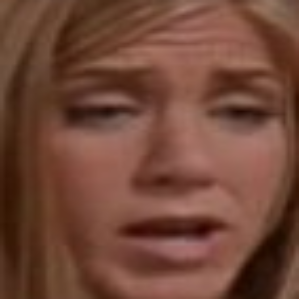

In [ ]:
cv2_imshow(training[32])

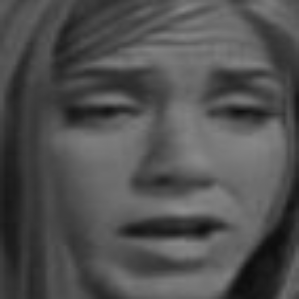

In [ ]:
cv2_imshow(X[32].reshape((299,299)))

In [ ]:
encodings = []
for i in range(len(training)):
  face_enc = face_recognition.face_encodings(training[i])
  encodings.append(face_enc)

In [ ]:
def flatten_list(_2d_list):
    flat_list = []
    for element in _2d_list:
        if type(element) is list:
            for item in element:
                flat_list.append(item)
        else:
            flat_list.append(element)
    return flat_list

In [ ]:
face_encode = flatten_list(encodings)

In [ ]:
#using K-means clustering algorithm
kmeans = KMeans(n_clusters=6, random_state=0).fit(face_encode)
cluster_labels = kmeans.labels_

In [ ]:
# cluster the embeddings
clt = DBSCAN(metric="euclidean", n_jobs= -1 )
clt.fit(face_encode)
# determine the total number of unique faces found in the dataset
labelIDs = np.unique(clt.labels_)
numUniqueFaces = len(np.where(labelIDs > -1)[0])
print("unique faces: {}".format(numUniqueFaces))

unique faces: 5


###DBSCAN model and labels

In [ ]:
clt.labels_

array([ 0,  1,  2,  3,  3, -1,  3,  1,  2,  3,  0,  1,  1,  4,  1,  2,  1,
        1,  0,  2,  3,  2,  2, -1,  2,  0,  1,  1,  3,  0, -1, -1,  1,  1,
        4,  1,  3, -1,  1,  3,  3,  2, -1,  3,  4,  1,  3,  2,  1,  2,  2,
        4,  0, -1,  2,  0,  1,  2,  4,  2, -1,  3, -1,  2,  2,  3,  1,  3,
        4,  0,  2,  2,  3,  0,  3,  4, -1, -1,  1,  4,  4,  2,  1,  1,  0,
        2,  2,  0,  3,  3,  0,  1])

In [ ]:
l0 = []
l0_label = []
l1 = []
l1_label = []
l2 = []
l2_label = []
l3 = []
l3_label = []
l4 = []
l4_label = []
l5 = []
l5_label = []
for i in range(len(clt.labels_)):
  if clt.labels_[i] == 0 :
    l0.append(training[i])
    l0_label.append(image_labels[i])
  if clt.labels_[i] == 1 :
    l1.append(training[i])
    l1_label.append(image_labels[i])
  if clt.labels_[i] == 2 :
    l2.append(training[i])
    l2_label.append(image_labels[i])
  if clt.labels_[i] == 3 :
    l3.append(training[i])
    l3_label.append(image_labels[i])
  if clt.labels_[i] == 4 :
    l4.append(training[i])
    l4_label.append(image_labels[i])
  if clt.labels_[i] == 5 :
    l5.append(training[i])
    l5_label.append(image_labels[i])

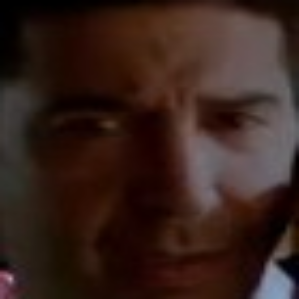

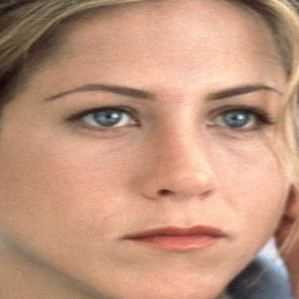

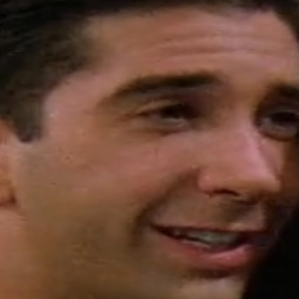

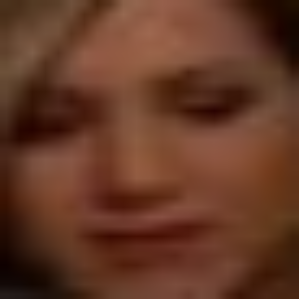

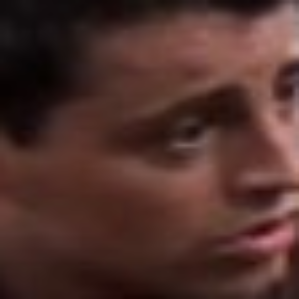

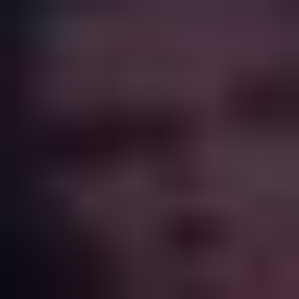

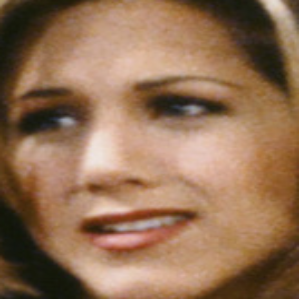

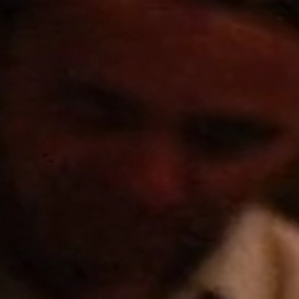

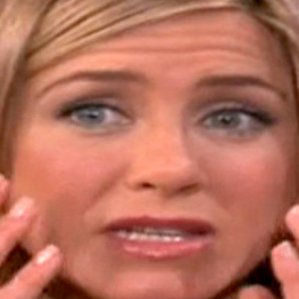

IndexError: ignored

In [ ]:
for i in range(len(l4)):
  cv2_imshow(l4[i])

###KNN model and labels

In [ ]:
cluster_labels

array([2, 1, 3, 0, 5, 4, 0, 1, 3, 5, 2, 1, 1, 4, 1, 3, 1, 1, 2, 3, 0, 3,
       3, 4, 3, 2, 1, 1, 5, 2, 1, 1, 1, 1, 4, 1, 5, 4, 1, 5, 0, 3, 3, 5,
       4, 1, 0, 3, 1, 3, 3, 4, 2, 3, 3, 2, 1, 3, 4, 3, 2, 0, 5, 3, 3, 5,
       1, 0, 4, 2, 3, 3, 5, 2, 0, 4, 2, 5, 1, 4, 4, 3, 1, 1, 2, 3, 3, 2,
       5, 0, 2, 1], dtype=int32)

In [ ]:
kl0 = []
kl0_label = []
kl1 = []
kl1_label = []
kl2 = []
kl2_label = []
kl3 = []
kl3_label = []
kl4 = []
kl4_label = []
kl5 = []
kl5_label = []
for i in range(len(cluster_labels)):
  if cluster_labels[i] == 0 :
    kl0.append(training[i])
    kl0_label.append(image_labels[i])
  if cluster_labels[i] == 1 :
    kl1.append(training[i])
    kl1_label.append(image_labels[i])
  if cluster_labels[i] == 2 :
    kl2.append(training[i])
    kl2_label.append(image_labels[i])
  if cluster_labels[i] == 3 :
    kl3.append(training[i])
    kl3_label.append(image_labels[i])
  if cluster_labels[i] == 4 :
    kl4.append(training[i])
    kl4_label.append(image_labels[i])
  if cluster_labels[i] == 5 :
    kl5.append(training[i])
    kl5_label.append(image_labels[i])

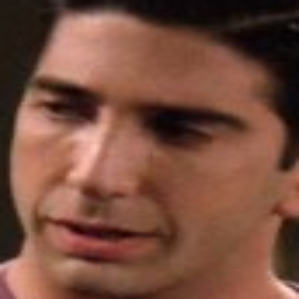

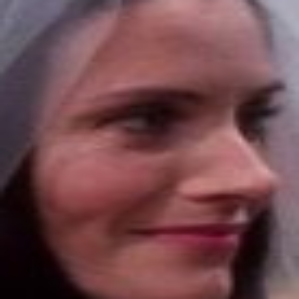

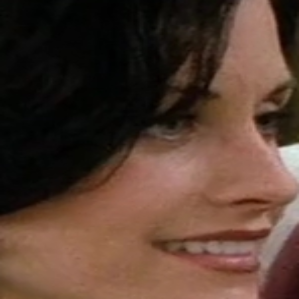

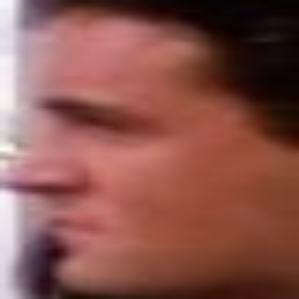

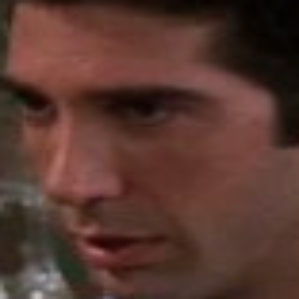

...

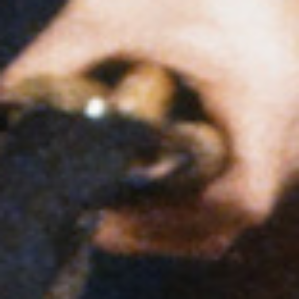

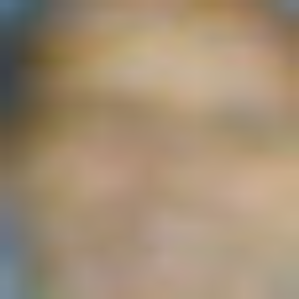

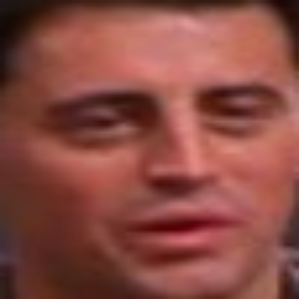

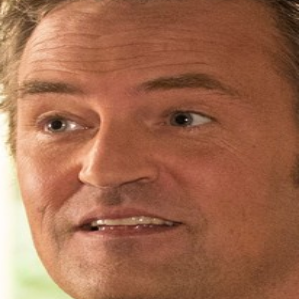

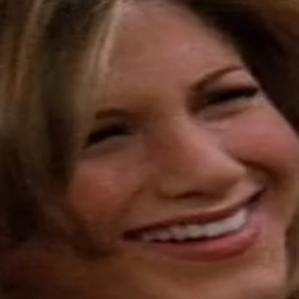

In [ ]:
for i in range(len(kl2)):
  cv2_imshow(kl2[i])

In [ ]:
! pip install python-facepp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for python-facepp: filename=python_facepp-0.1.0a5-py2.py3-none-any.whl size=29121 sha256=09eb114f08149c3963779ab457c46a8de2dfbc12928164b4d769d29df3becbae
  Stored in directory: /root/.cache/pip/wheels/52/c5/61/5fee8f953c94e8e30e7c7c6b3a3f0bd5aa03461ff40bfc7d62
Successfully built python-facepp


In [ ]:
from facepplib import FacePP, exceptions

In [ ]:
label0 : chandler 87
label1 : joey 42
label2 : monica 149
label3 : pheobe 43
label4 : rachel 34
label5 : ross 139

In [ ]:
len(face_encode)

92

In [ ]:
label0 = face_encode[87]
label1 = face_encode[42]
label2 = face_encode[149]
label3 = face_encode[43]
label4 = face_encode[34]
label5 = face_encode[139]
p1 = []
v1 = []
p2 = []
v2 = []
p3 = []
v3 = []
p4 = []
v4 = []
p5 = []
v5 = []
p0 = []
v0 = []
for k in range(len(face_encode)):
  p1.append(spatial.distance.correlation(label1,face_encode[k]))
  v1.append(image_labels[k])
  p2.append(spatial.distance.correlation(label2,face_encode[k]))
  v2.append(image_labels[k])
  p3.append(spatial.distance.correlation(label3,face_encode[k]))
  v3.append(image_labels[k])
  p4.append(spatial.distance.correlation(label4,face_encode[k]))
  v4.append(image_labels[k])
  p5.append(spatial.distance.correlation(label5,face_encode[k]))
  v5.append(image_labels[k])
  p0.append(spatial.distance.correlation(label0,face_encode[k]))
  v0.append(image_labels[k])
p1.sort()
p2.sort()
p3.sort()
p4.sort()
p5.sort()
p0.sort()

IndexError: ignored

In [ ]:
def sorting_of_element(list1,list2):

    # initializing blank dictionary
    f_1 = {}

    # initializing blank list
    final_list = []

    # Addition of two list in one dictionary
    f_1 = {list1[i]: list2[i] for i in range(len(list2))}

    # sorting of dictionary based on value
    f_lst = {k: v for k, v in sorted(f_1.items(), key=lambda item: item[1])}

    # Element addition in the list
    for i in f_lst.keys():
        final_list.append(i)
    return final_list

list3=sorting_of_element(list1,list2)
print(list3)

In [ ]:
prediction_submission = pd.read_csv("/content/IIT-Bhilai-Day 2/Training_Friends_Dataset_100_Imgs.csv")

In [ ]:
prediction_submission

,S.No,label_0,label_1,label_2,label_3,label_4,label_5
0,013e51cf-1999-44ac-8004-542a0de4026f.JPG,0,0,0,0,0,0
1,01973cc2-75d5-4844-9d36-675b91c402e9.JPG,0,0,0,0,0,0
2,03d24609-64ca-4f43-9b80-f073e6433c49.JPG,0,0,0,0,0,0
3,04f16b2a-e54d-4e5e-bba6-75365d8efc3e.JPG,0,0,0,0,0,0
4,04f48620-de82-4f55-a787-ac234cd861d2.JPG,0,0,0,0,0,0
...,...,...,...,...,...,...,...
94,561c244b-3e04-4ed1-8cbd-efe27cffd6e9.JPG,0,0,0,0,0,0
95,58f6062d-7e95-415b-83fd-c2d9ad84b7a3.JPG,0,0,0,0,0,0
96,5aa7e7ee-ea63-470e-a06a-73aa7ae724cb.JPG,0,0,0,0,0,0
97,5ad461b7-d716-451a-95c3-ce4fb3cfc160.JPG,0,0,0,0,0,0
